In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
import matplotlib.pyplot as plt

In [2]:
tf.random.set_seed(42)
np.random.seed(42)

In [3]:
(train_images, _), (_, _) = tf.keras.datasets.mnist.load_data()
train_images = train_images / 127.5 - 1.0 

11490434/11490434 [==============================] - 28s 2us/step


In [4]:
def build_generator():
    model = models.Sequential()
    model.add(layers.Dense(256, input_dim=100, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(784, activation='tanh'))
    model.add(layers.Reshape((28, 28, 1)))
    return model

In [5]:
def build_discriminator():
    model = models.Sequential()
    model.add(layers.Flatten(input_shape=(28, 28, 1)))
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

In [6]:
discriminator = build_discriminator()
discriminator.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
                      loss='binary_crossentropy',
                      metrics=['accuracy'])

In [7]:
generator = build_generator()

In [8]:
discriminator.trainable = False
gan_input = tf.keras.Input(shape=(100,))
x = generator(gan_input)
gan_output = discriminator(x)
gan = models.Model(gan_input, gan_output)
gan.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
            loss='binary_crossentropy')

In [9]:
epochs = 10000
batch_size = 64

2/2 [==============================] - 0s 16ms/step
Epoch 0, Discriminator Loss: 0.7537339329719543, Generator Loss: 0.8698501586914062


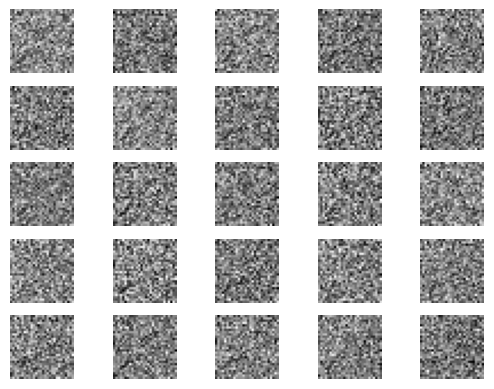

2/2 [==============================] - 0s 0s/step
Epoch 100, Discriminator Loss: 0.173094242811203, Generator Loss: 6.790804862976074


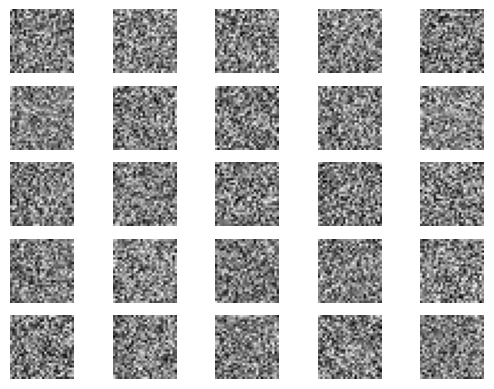

2/2 [==============================] - 0s 16ms/step
Epoch 200, Discriminator Loss: 0.17135539650917053, Generator Loss: 7.398868083953857


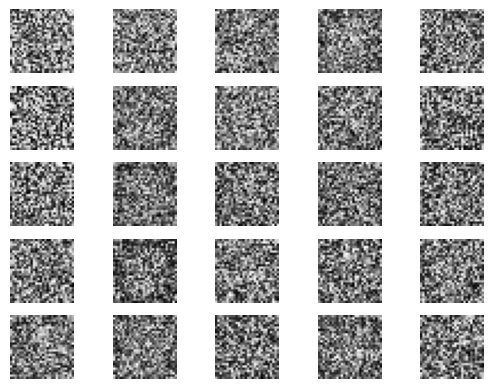

2/2 [==============================] - 0s 10ms/step
Epoch 300, Discriminator Loss: 0.2441263645887375, Generator Loss: 5.3563432693481445


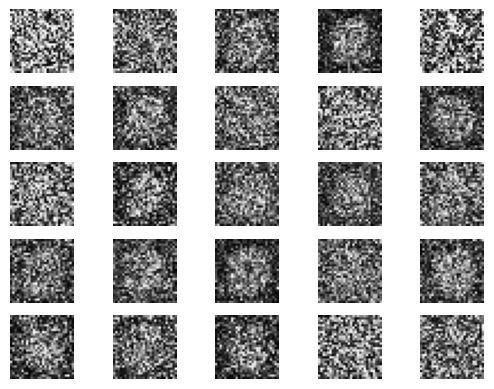

2/2 [==============================] - 0s 11ms/step
Epoch 400, Discriminator Loss: 0.4334840476512909, Generator Loss: 2.6465115547180176


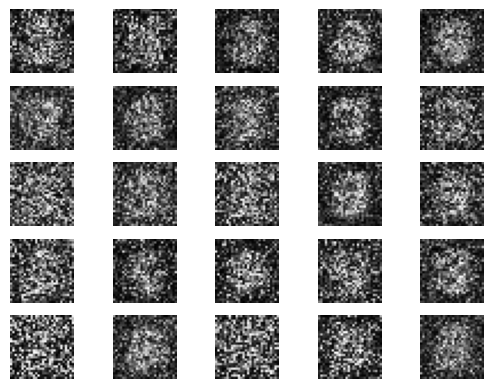

2/2 [==============================] - 0s 12ms/step
Epoch 500, Discriminator Loss: 0.4641483426094055, Generator Loss: 1.0520042181015015


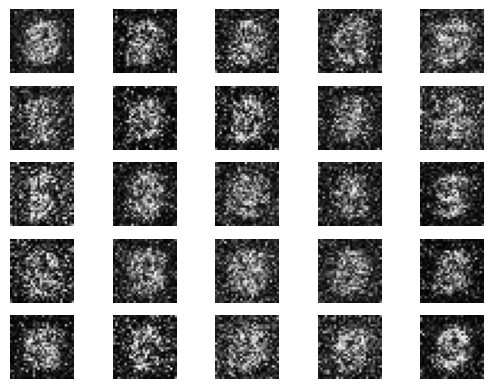

2/2 [==============================] - 0s 8ms/step
Epoch 600, Discriminator Loss: 0.5853714942932129, Generator Loss: 0.9177080392837524


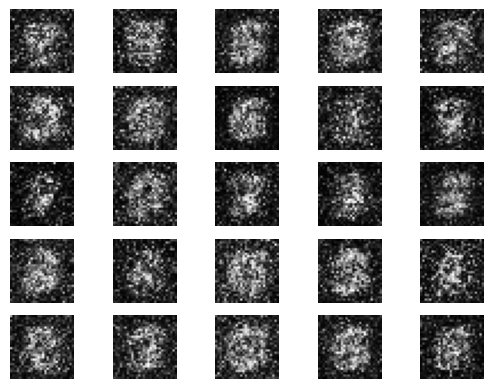

2/2 [==============================] - 0s 0s/step
Epoch 700, Discriminator Loss: 0.5586709976196289, Generator Loss: 1.213720679283142


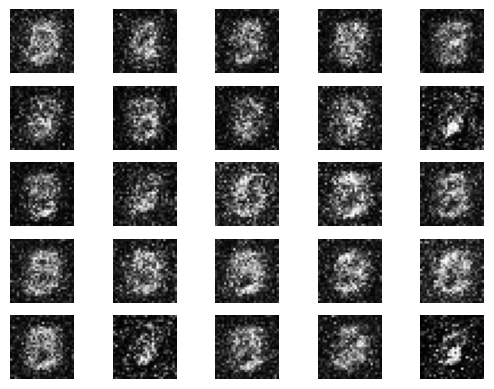

2/2 [==============================] - 0s 10ms/step
Epoch 800, Discriminator Loss: 0.6013151407241821, Generator Loss: 1.351894736289978


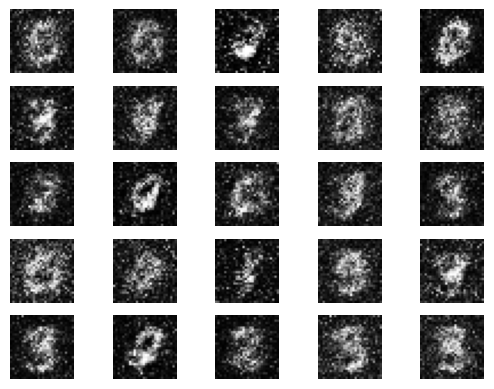

2/2 [==============================] - 0s 7ms/step
Epoch 900, Discriminator Loss: 0.5745593309402466, Generator Loss: 1.2074058055877686


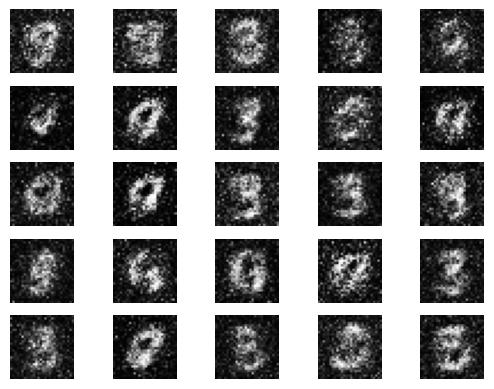

2/2 [==============================] - 0s 0s/step
Epoch 1000, Discriminator Loss: 0.6322794556617737, Generator Loss: 1.323410987854004


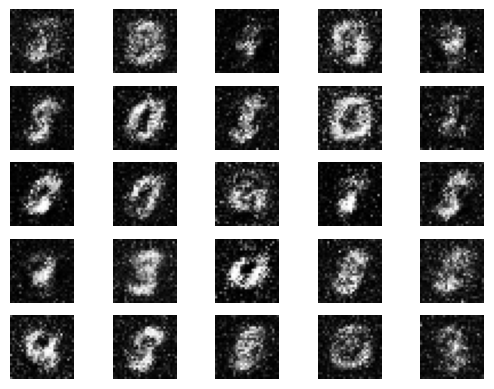

2/2 [==============================] - 0s 11ms/step
Epoch 1100, Discriminator Loss: 0.5883111953735352, Generator Loss: 0.8598271608352661


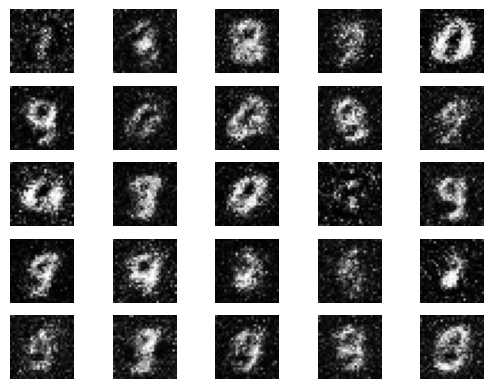

2/2 [==============================] - 0s 9ms/step
Epoch 1200, Discriminator Loss: 0.5975680351257324, Generator Loss: 0.9840015172958374


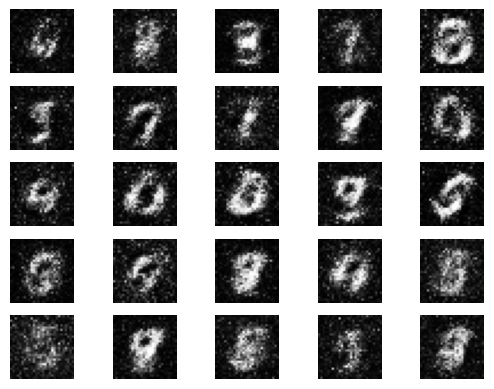

2/2 [==============================] - 0s 11ms/step
Epoch 1300, Discriminator Loss: 0.5495522022247314, Generator Loss: 1.251994252204895


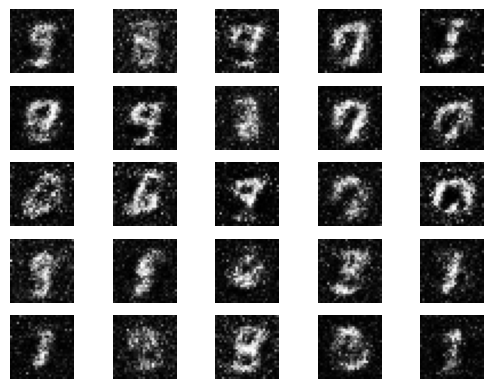

2/2 [==============================] - 0s 5ms/step
Epoch 1400, Discriminator Loss: 0.5911526679992676, Generator Loss: 0.9681420922279358


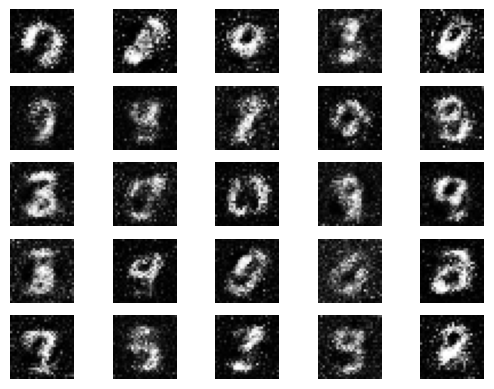

2/2 [==============================] - 0s 8ms/step
Epoch 1500, Discriminator Loss: 0.6142899394035339, Generator Loss: 0.6838293075561523


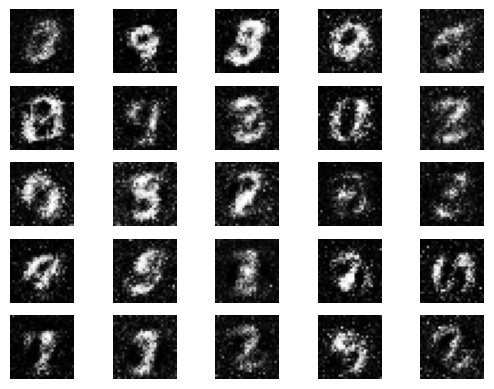

2/2 [==============================] - 0s 0s/step
Epoch 1600, Discriminator Loss: 0.5812956690788269, Generator Loss: 1.207531452178955


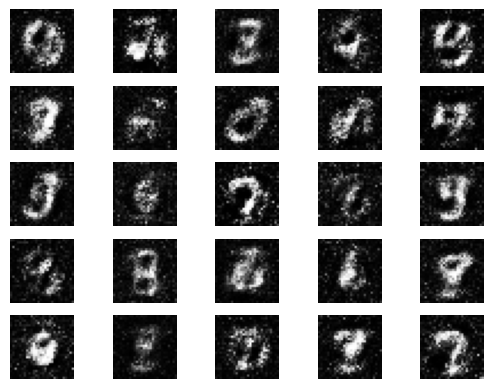

2/2 [==============================] - 0s 18ms/step
Epoch 1700, Discriminator Loss: 0.5421183109283447, Generator Loss: 1.3426084518432617


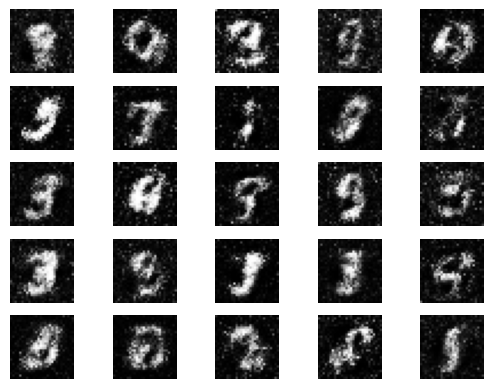

2/2 [==============================] - 0s 13ms/step
Epoch 1800, Discriminator Loss: 0.5999574065208435, Generator Loss: 0.9888414740562439


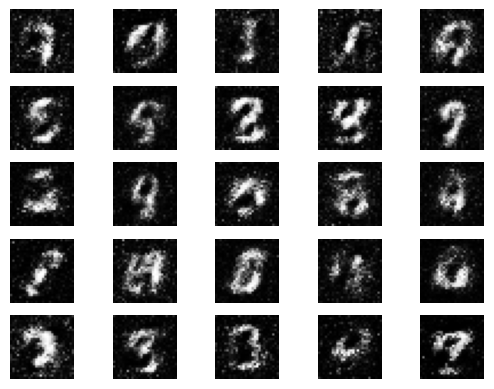

2/2 [==============================] - 0s 7ms/step
Epoch 1900, Discriminator Loss: 0.5520772933959961, Generator Loss: 1.1159915924072266


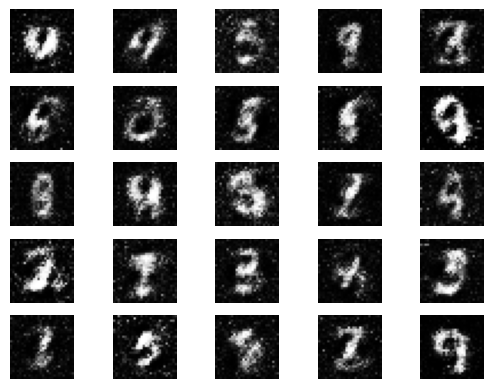

2/2 [==============================] - 0s 4ms/step
Epoch 2000, Discriminator Loss: 0.6326427459716797, Generator Loss: 0.767230212688446


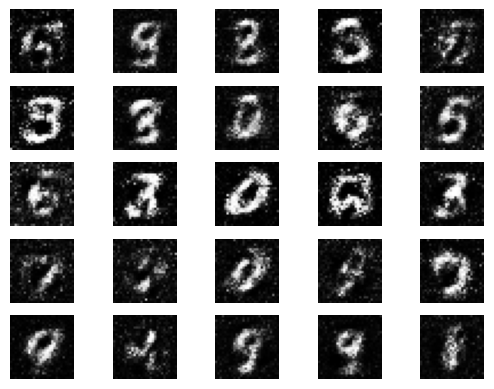

2/2 [==============================] - 0s 6ms/step
Epoch 2100, Discriminator Loss: 0.5524353981018066, Generator Loss: 1.178189992904663


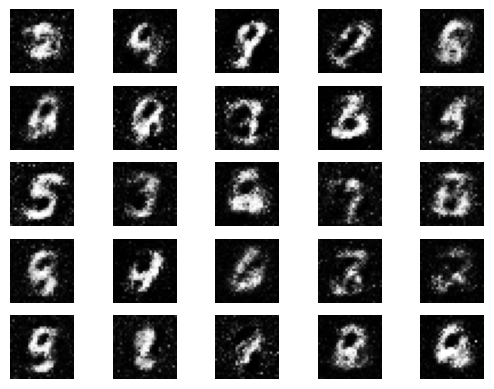

2/2 [==============================] - 0s 10ms/step
Epoch 2200, Discriminator Loss: 0.6067858934402466, Generator Loss: 1.1983805894851685


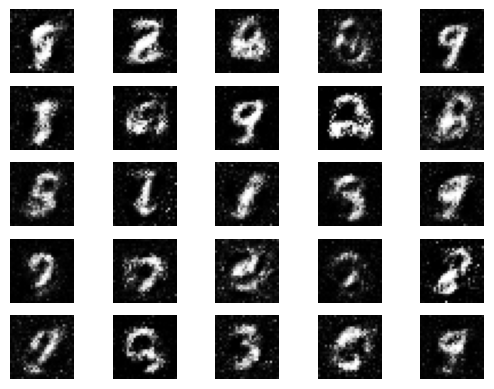

2/2 [==============================] - 0s 0s/step
Epoch 2300, Discriminator Loss: 0.5776939392089844, Generator Loss: 1.0481843948364258


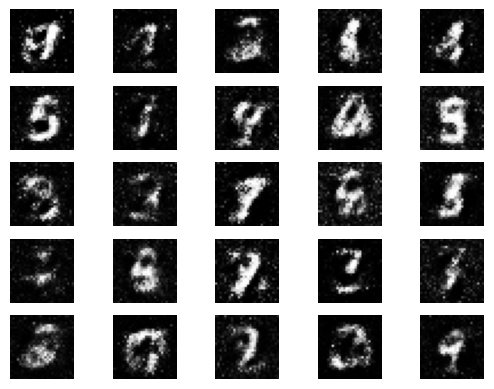

2/2 [==============================] - 0s 16ms/step
Epoch 2400, Discriminator Loss: 0.6124016046524048, Generator Loss: 0.9335886240005493


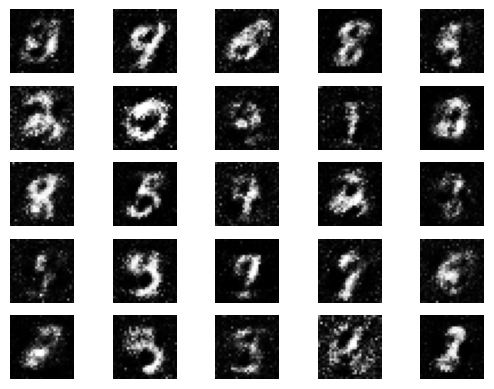

2/2 [==============================] - 0s 7ms/step
Epoch 2500, Discriminator Loss: 0.5956087112426758, Generator Loss: 1.0233442783355713


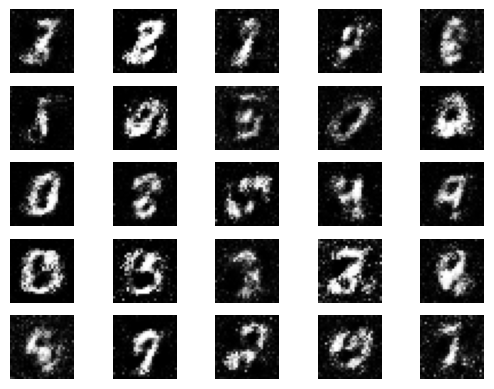

2/2 [==============================] - 0s 7ms/step
Epoch 2600, Discriminator Loss: 0.5830528736114502, Generator Loss: 1.1724853515625


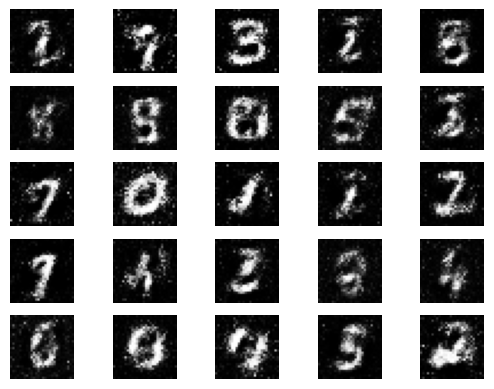

2/2 [==============================] - 0s 5ms/step
Epoch 2700, Discriminator Loss: 0.6128791570663452, Generator Loss: 1.0012578964233398


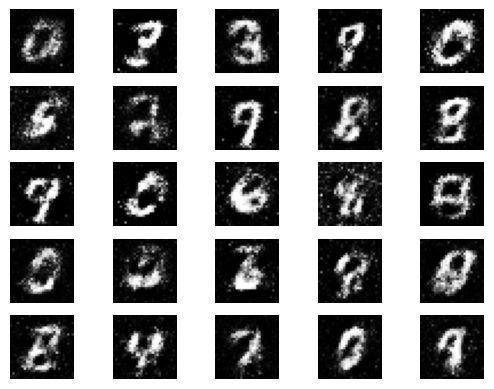

2/2 [==============================] - 0s 2ms/step
Epoch 2800, Discriminator Loss: 0.572548508644104, Generator Loss: 1.2569828033447266


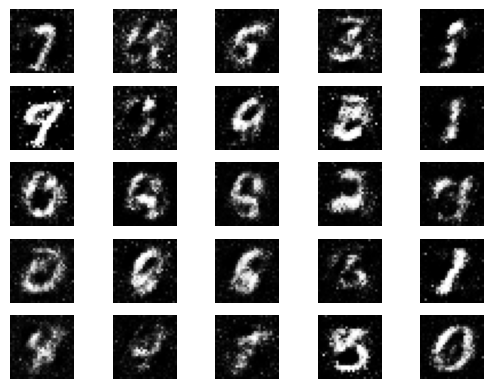

2/2 [==============================] - 0s 10ms/step
Epoch 2900, Discriminator Loss: 0.603875994682312, Generator Loss: 1.186221957206726


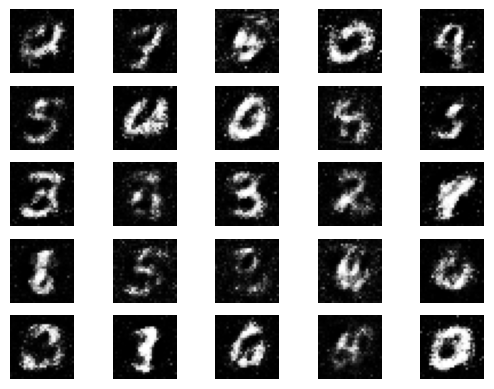

2/2 [==============================] - 0s 9ms/step
Epoch 3000, Discriminator Loss: 0.5898568630218506, Generator Loss: 1.0647021532058716


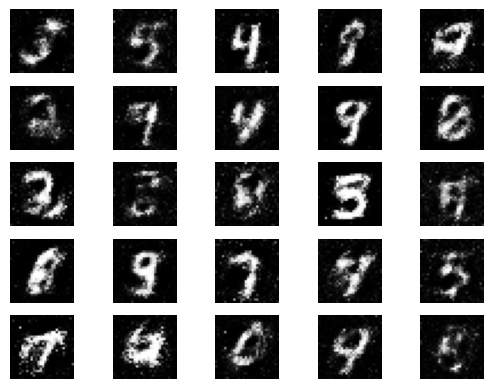

2/2 [==============================] - 0s 0s/step
Epoch 3100, Discriminator Loss: 0.6161829233169556, Generator Loss: 1.0086952447891235


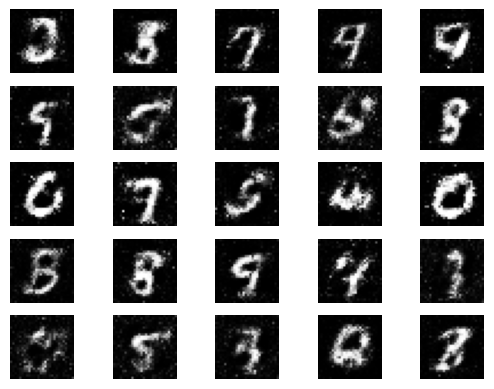

2/2 [==============================] - 0s 0s/step
Epoch 3200, Discriminator Loss: 0.5095468759536743, Generator Loss: 1.2940987348556519


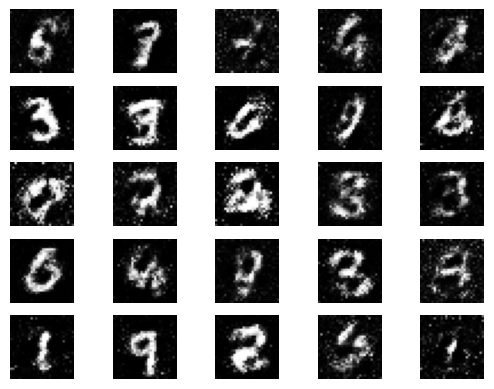

2/2 [==============================] - 0s 5ms/step
Epoch 3300, Discriminator Loss: 0.5716679096221924, Generator Loss: 0.9957706928253174


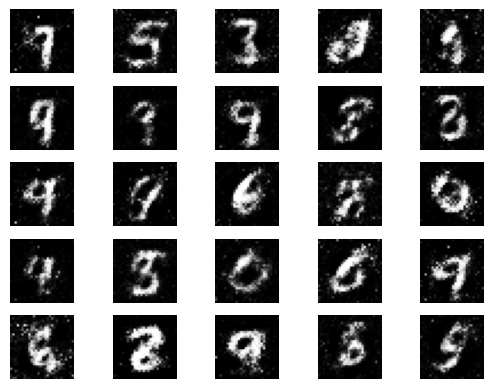

2/2 [==============================] - 0s 0s/step
Epoch 3400, Discriminator Loss: 0.5897947549819946, Generator Loss: 1.4374343156814575


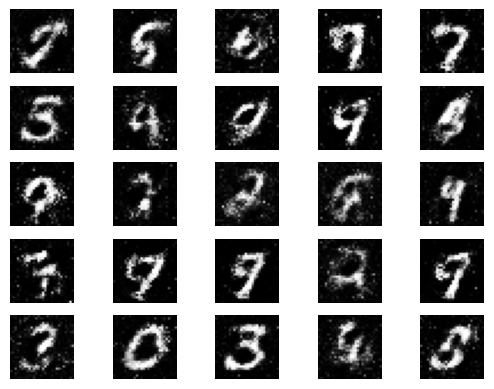

2/2 [==============================] - 0s 15ms/step
Epoch 3500, Discriminator Loss: 0.5190181136131287, Generator Loss: 1.139076828956604


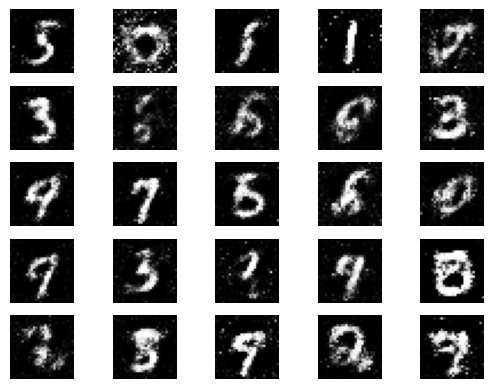

2/2 [==============================] - 0s 4ms/step
Epoch 3600, Discriminator Loss: 0.6005635857582092, Generator Loss: 1.2747858762741089


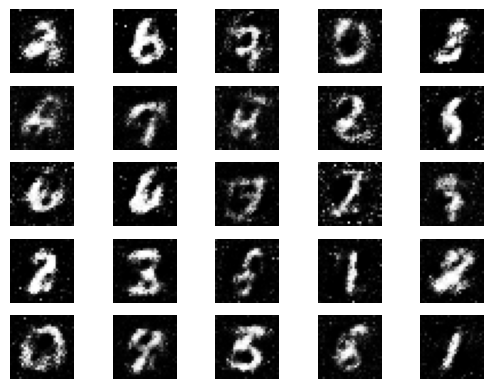

2/2 [==============================] - 0s 3ms/step
Epoch 3700, Discriminator Loss: 0.5777235627174377, Generator Loss: 1.2380528450012207


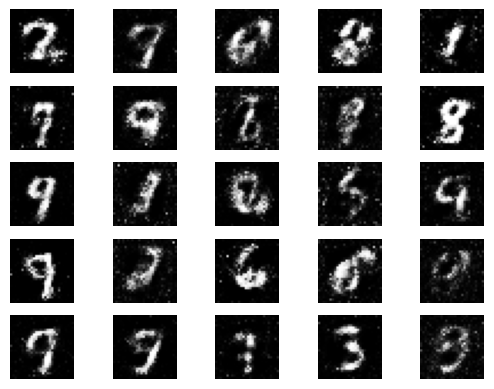

2/2 [==============================] - 0s 5ms/step
Epoch 3800, Discriminator Loss: 0.6074374914169312, Generator Loss: 1.0008906126022339


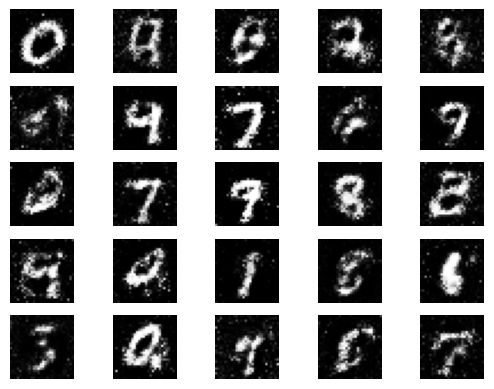

2/2 [==============================] - 0s 13ms/step
Epoch 3900, Discriminator Loss: 0.5724058747291565, Generator Loss: 1.2335032224655151


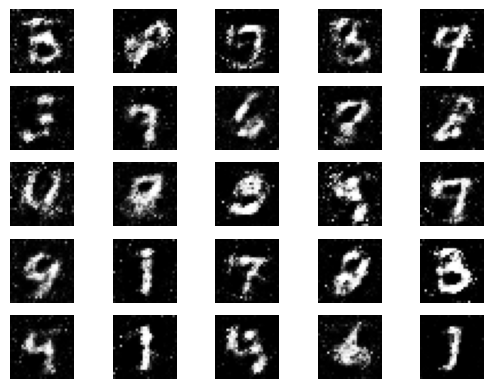

2/2 [==============================] - 0s 12ms/step
Epoch 4000, Discriminator Loss: 0.609459400177002, Generator Loss: 0.9758775234222412


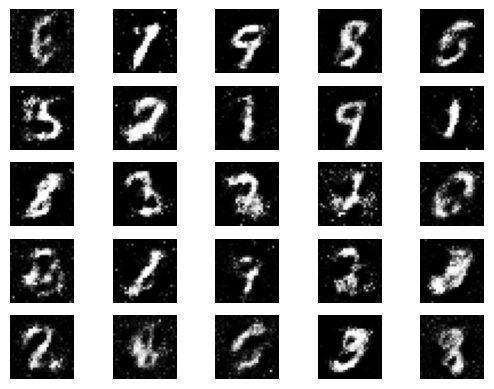

2/2 [==============================] - 0s 12ms/step
Epoch 4100, Discriminator Loss: 0.5903497934341431, Generator Loss: 1.0881506204605103


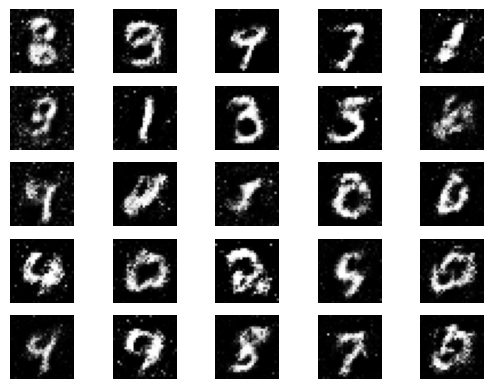

2/2 [==============================] - 0s 14ms/step
Epoch 4200, Discriminator Loss: 0.5337818264961243, Generator Loss: 1.1459474563598633


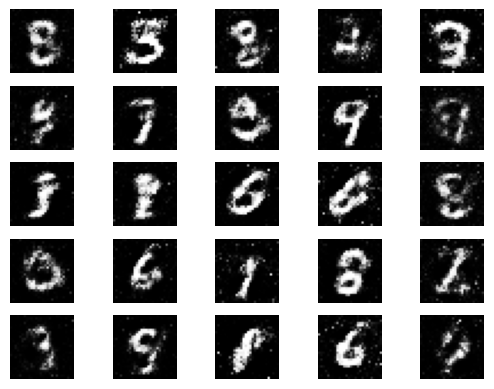

2/2 [==============================] - 0s 8ms/step
Epoch 4300, Discriminator Loss: 0.5906394720077515, Generator Loss: 1.1534903049468994


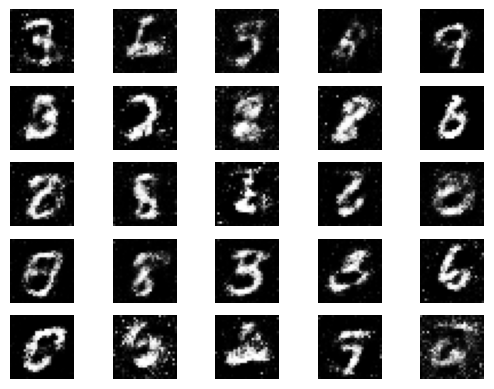

2/2 [==============================] - 0s 9ms/step
Epoch 4400, Discriminator Loss: 0.542896568775177, Generator Loss: 1.1099097728729248


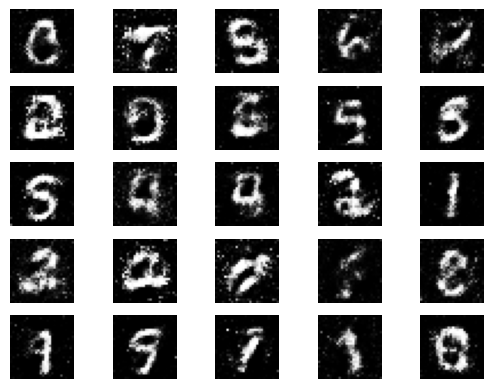

2/2 [==============================] - 0s 5ms/step
Epoch 4500, Discriminator Loss: 0.6069982051849365, Generator Loss: 1.0736970901489258


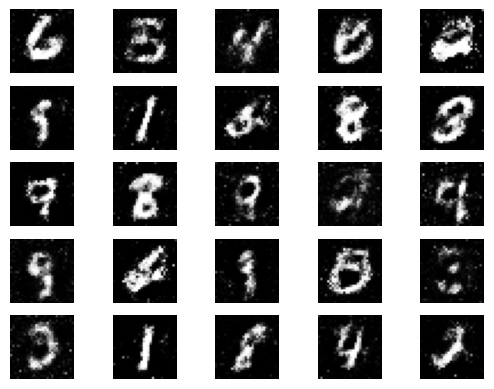

2/2 [==============================] - 0s 6ms/step
Epoch 4600, Discriminator Loss: 0.5621037483215332, Generator Loss: 1.0423423051834106


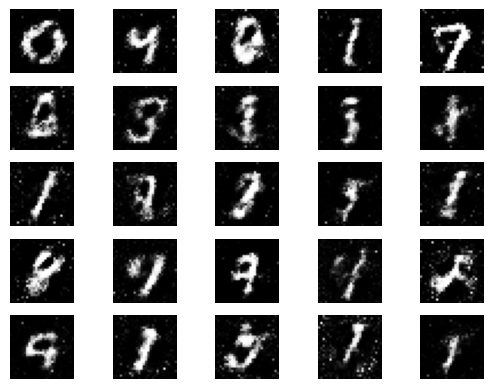

2/2 [==============================] - 0s 0s/step
Epoch 4700, Discriminator Loss: 0.6322215795516968, Generator Loss: 0.9155956506729126


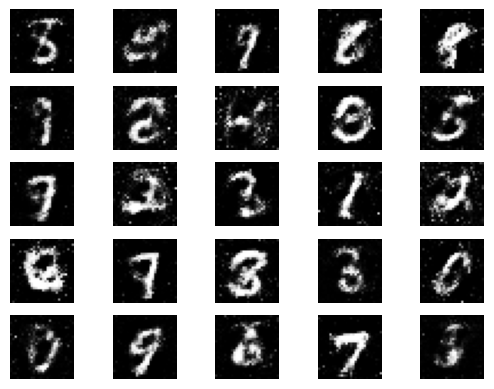

2/2 [==============================] - 0s 0s/step
Epoch 4800, Discriminator Loss: 0.609450101852417, Generator Loss: 1.1718995571136475


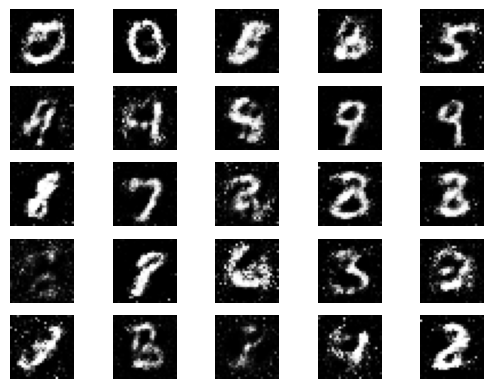

2/2 [==============================] - 0s 16ms/step
Epoch 4900, Discriminator Loss: 0.5903409719467163, Generator Loss: 0.8740502595901489


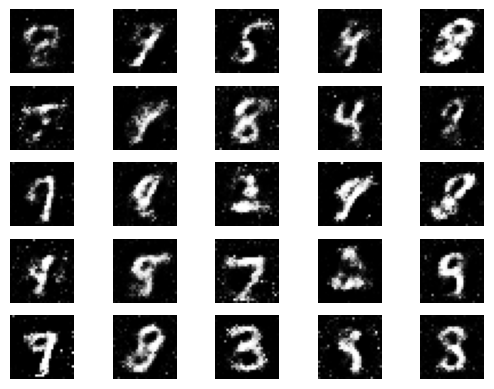

2/2 [==============================] - 0s 0s/step
Epoch 5000, Discriminator Loss: 0.6277372241020203, Generator Loss: 1.0267211198806763


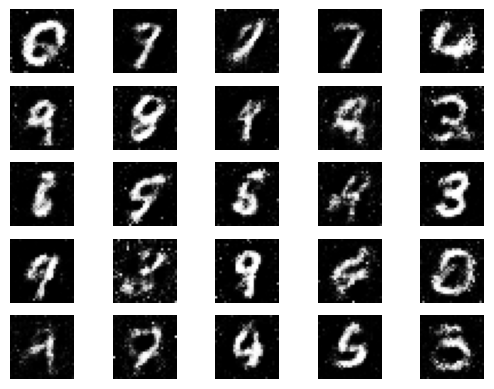

2/2 [==============================] - 0s 8ms/step
Epoch 5100, Discriminator Loss: 0.5788848400115967, Generator Loss: 1.127106785774231


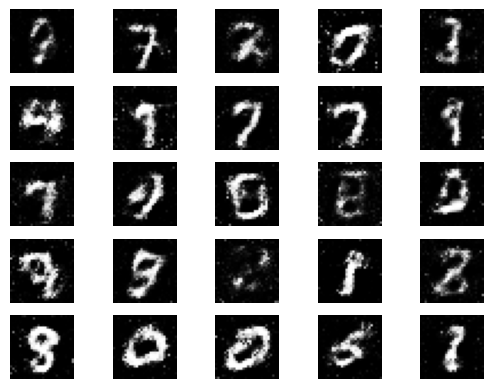

2/2 [==============================] - 0s 0s/step
Epoch 5200, Discriminator Loss: 0.5636394023895264, Generator Loss: 1.1505628824234009


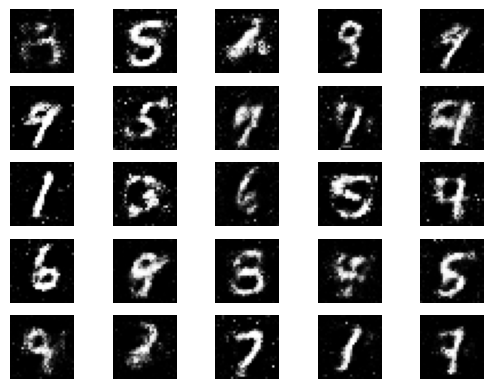

2/2 [==============================] - 0s 16ms/step
Epoch 5300, Discriminator Loss: 0.5980246067047119, Generator Loss: 1.082533836364746


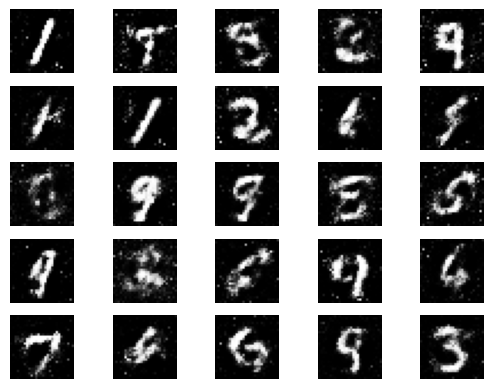

2/2 [==============================] - 0s 0s/step
Epoch 5400, Discriminator Loss: 0.5525943040847778, Generator Loss: 1.023946762084961


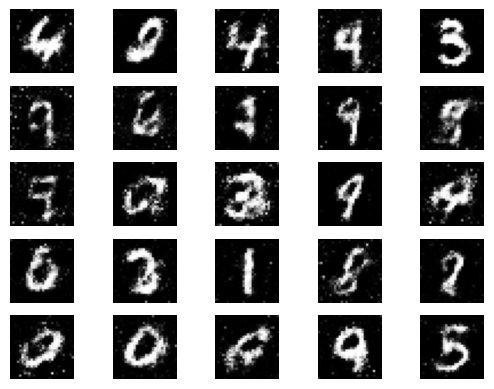

2/2 [==============================] - 0s 10ms/step
Epoch 5500, Discriminator Loss: 0.5901803970336914, Generator Loss: 1.1635446548461914


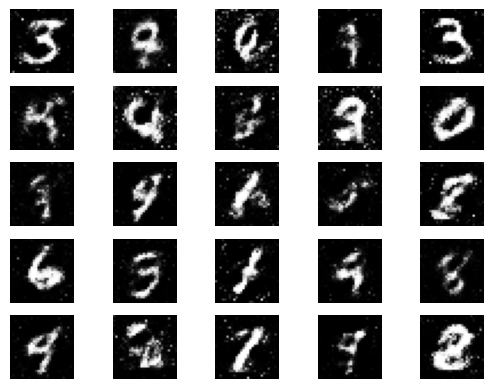

2/2 [==============================] - 0s 0s/step
Epoch 5600, Discriminator Loss: 0.5448353290557861, Generator Loss: 1.229353427886963


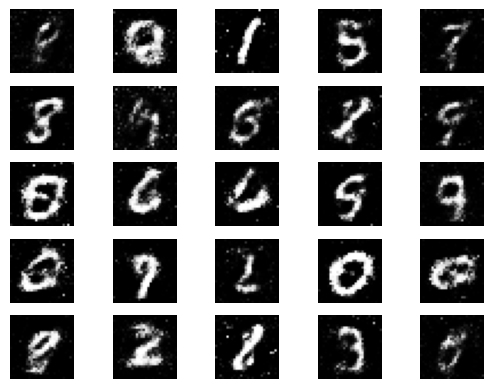

2/2 [==============================] - 0s 20ms/step
Epoch 5700, Discriminator Loss: 0.5977392196655273, Generator Loss: 1.2955987453460693


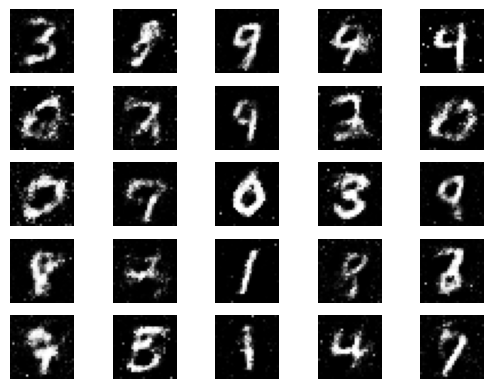

2/2 [==============================] - 0s 0s/step
Epoch 5800, Discriminator Loss: 0.5429767370223999, Generator Loss: 1.0944703817367554


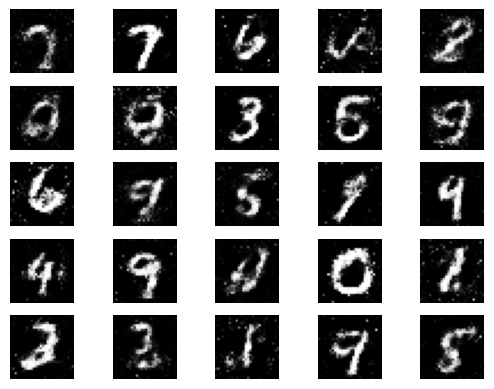

2/2 [==============================] - 0s 0s/step
Epoch 5900, Discriminator Loss: 0.5682258605957031, Generator Loss: 1.2448279857635498


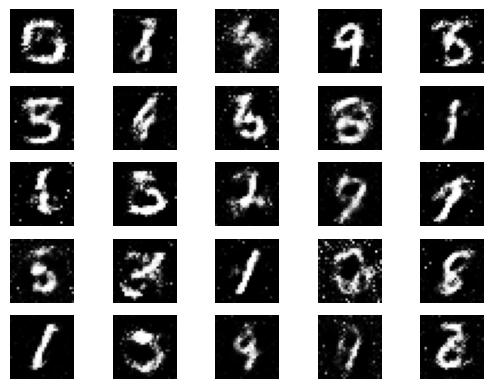

2/2 [==============================] - 0s 0s/step
Epoch 6000, Discriminator Loss: 0.5525455474853516, Generator Loss: 1.2385890483856201


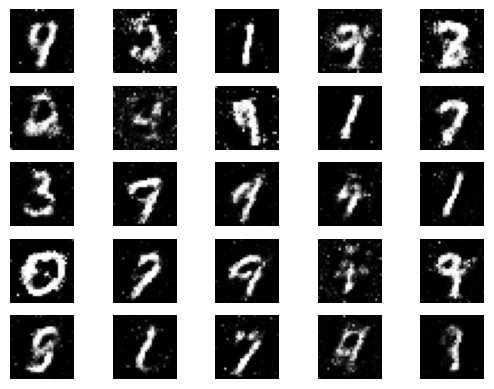

2/2 [==============================] - 0s 0s/step
Epoch 6100, Discriminator Loss: 0.6120305061340332, Generator Loss: 1.1573221683502197


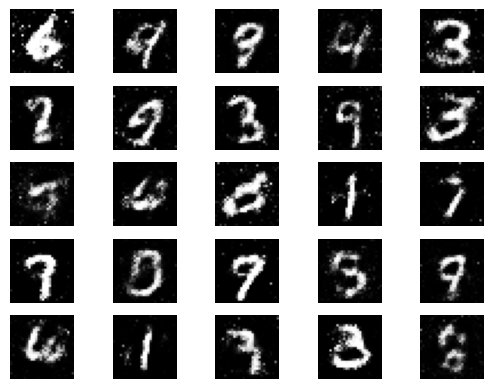

2/2 [==============================] - 0s 0s/step
Epoch 6200, Discriminator Loss: 0.594752311706543, Generator Loss: 1.1938183307647705


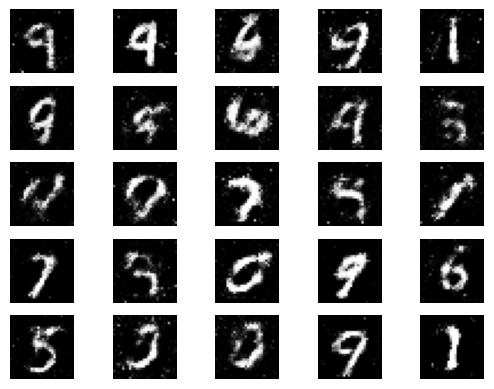

2/2 [==============================] - 0s 0s/step
Epoch 6300, Discriminator Loss: 0.5816316604614258, Generator Loss: 1.1407477855682373


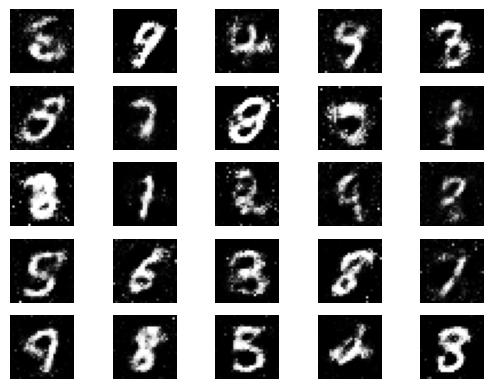

2/2 [==============================] - 0s 7ms/step
Epoch 6400, Discriminator Loss: 0.6026322841644287, Generator Loss: 1.043069839477539


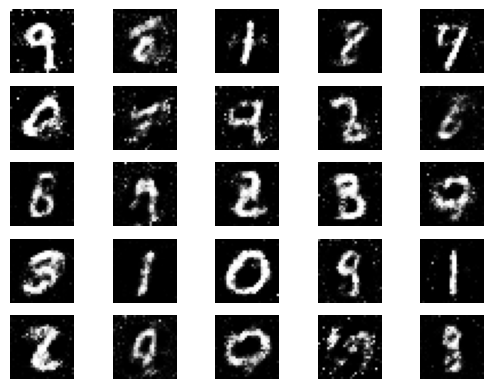

2/2 [==============================] - 0s 15ms/step
Epoch 6500, Discriminator Loss: 0.5818813443183899, Generator Loss: 1.0453647375106812


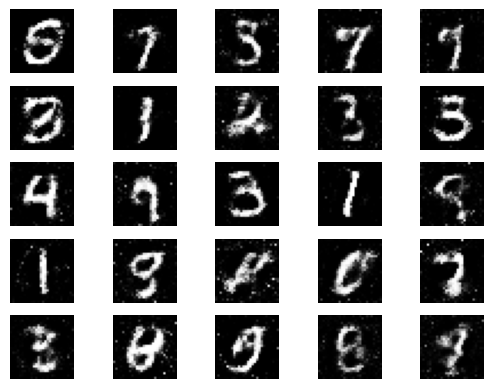

2/2 [==============================] - 0s 12ms/step
Epoch 6600, Discriminator Loss: 0.6085566282272339, Generator Loss: 1.0555146932601929


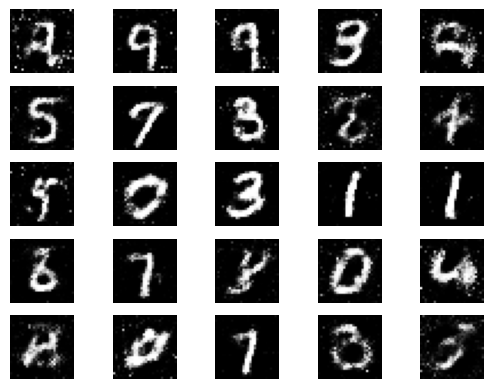

2/2 [==============================] - 0s 0s/step
Epoch 6700, Discriminator Loss: 0.5661961436271667, Generator Loss: 0.8885653018951416


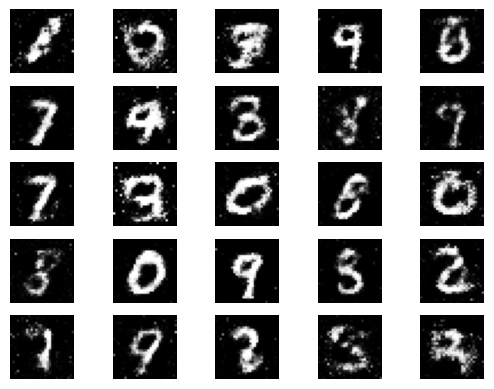

2/2 [==============================] - 0s 0s/step
Epoch 6800, Discriminator Loss: 0.5741446018218994, Generator Loss: 1.1337003707885742


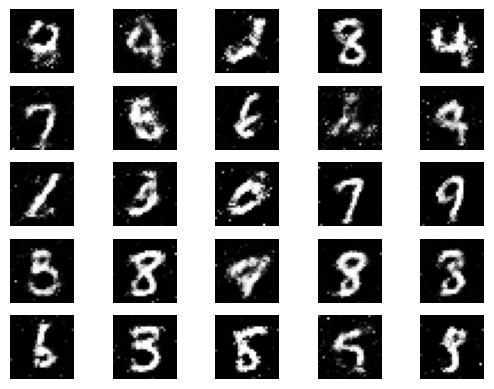

2/2 [==============================] - 0s 7ms/step
Epoch 6900, Discriminator Loss: 0.570968747138977, Generator Loss: 0.9742236733436584


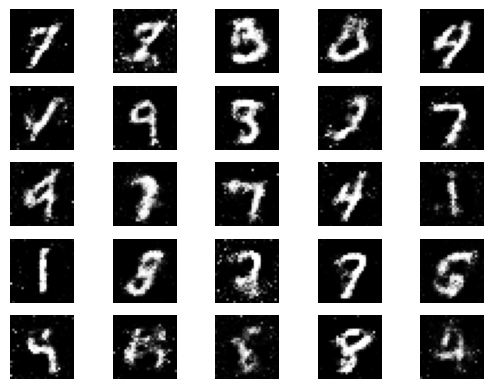

2/2 [==============================] - 0s 15ms/step
Epoch 7000, Discriminator Loss: 0.5610777139663696, Generator Loss: 1.1178834438323975


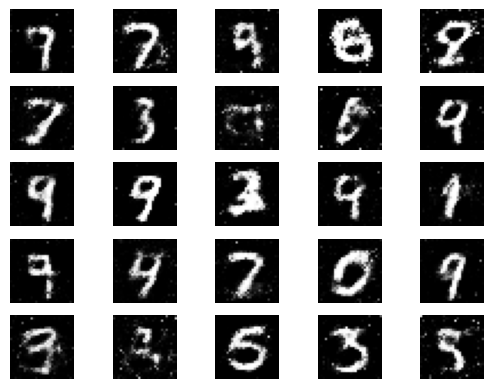

2/2 [==============================] - 0s 18ms/step
Epoch 7100, Discriminator Loss: 0.5974026322364807, Generator Loss: 0.9558436274528503


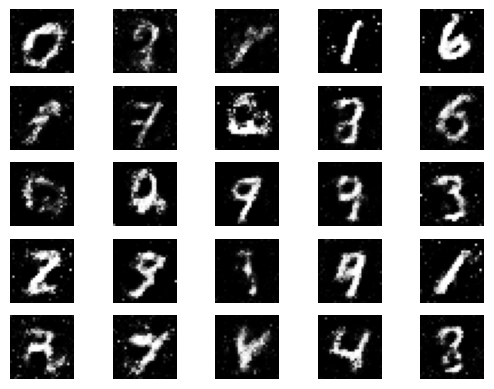

2/2 [==============================] - 0s 0s/step
Epoch 7200, Discriminator Loss: 0.5723608732223511, Generator Loss: 1.5108728408813477


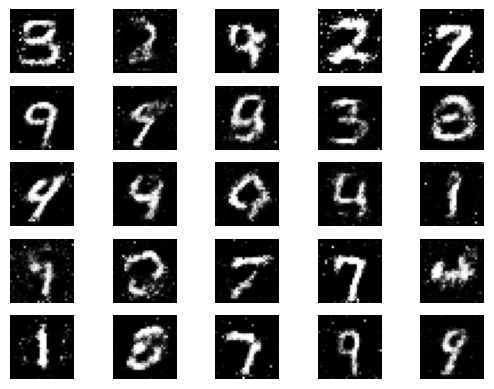

2/2 [==============================] - 0s 22ms/step
Epoch 7300, Discriminator Loss: 0.5980648398399353, Generator Loss: 1.3431211709976196


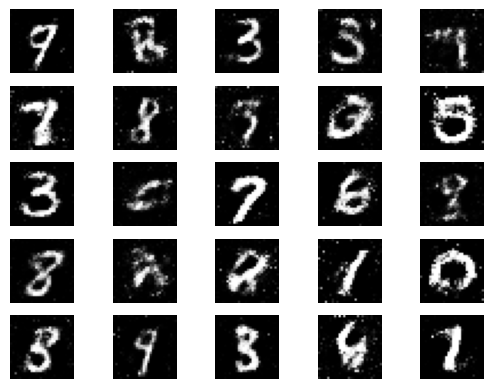

2/2 [==============================] - 0s 2ms/step
Epoch 7400, Discriminator Loss: 0.544235110282898, Generator Loss: 1.2063374519348145


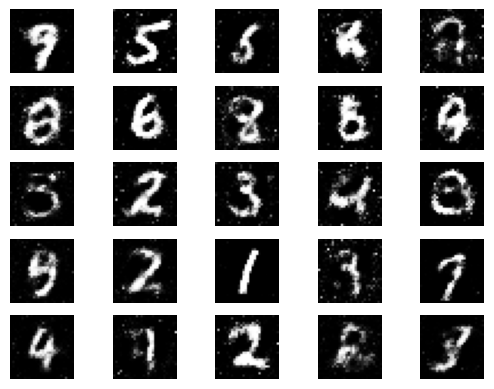

2/2 [==============================] - 0s 0s/step
Epoch 7500, Discriminator Loss: 0.629160463809967, Generator Loss: 0.9298956394195557


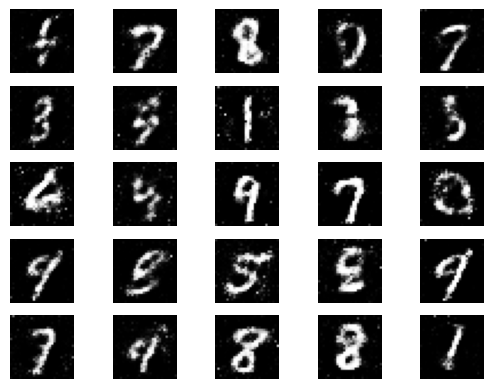

2/2 [==============================] - 0s 15ms/step
Epoch 7600, Discriminator Loss: 0.5953027606010437, Generator Loss: 1.2094318866729736


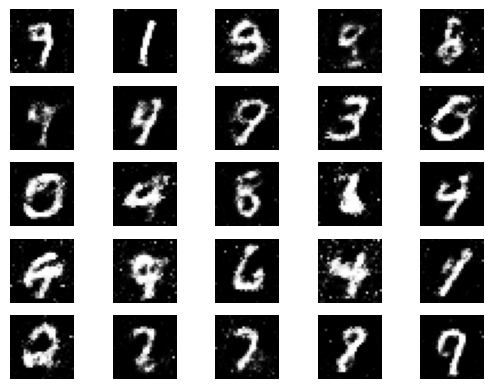

2/2 [==============================] - 0s 0s/step
Epoch 7700, Discriminator Loss: 0.5587278604507446, Generator Loss: 1.1810097694396973


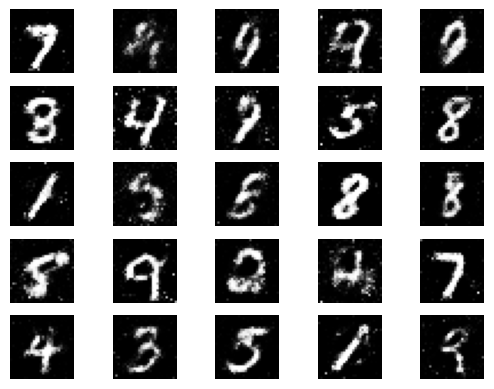

2/2 [==============================] - 0s 0s/step
Epoch 7800, Discriminator Loss: 0.6546664834022522, Generator Loss: 1.0546841621398926


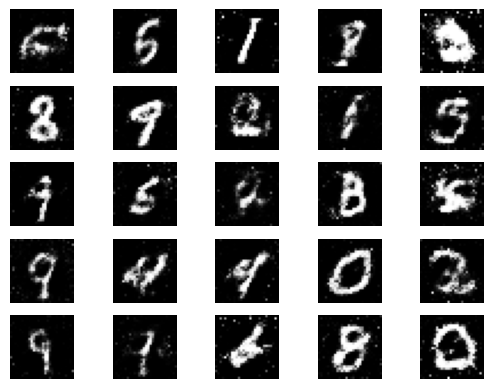

2/2 [==============================] - 0s 0s/step
Epoch 7900, Discriminator Loss: 0.562397301197052, Generator Loss: 1.5287179946899414


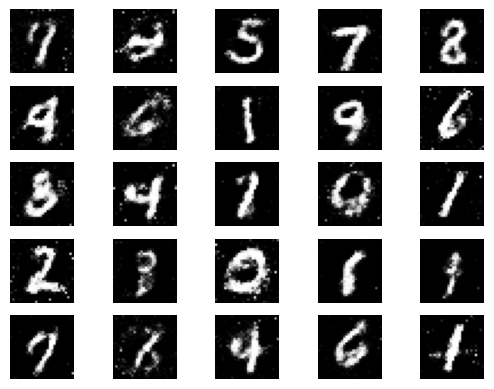

2/2 [==============================] - 0s 16ms/step
Epoch 8000, Discriminator Loss: 0.6089566946029663, Generator Loss: 1.2296843528747559


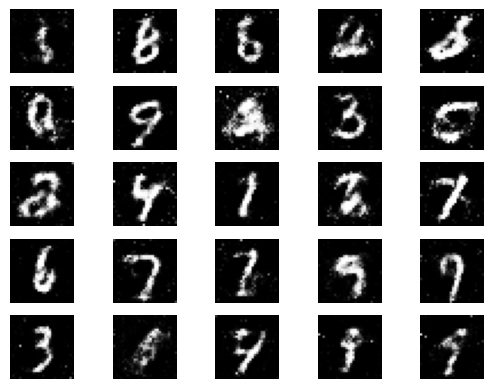

2/2 [==============================] - 0s 16ms/step
Epoch 8100, Discriminator Loss: 0.5589659214019775, Generator Loss: 1.161141276359558


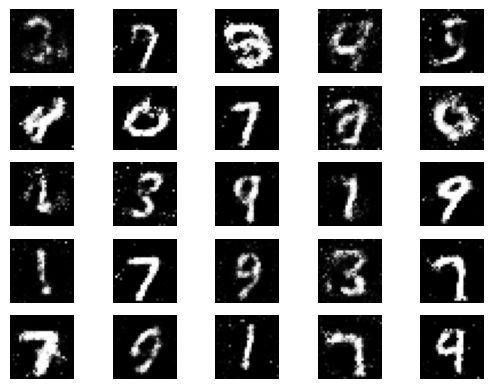

2/2 [==============================] - 0s 0s/step
Epoch 8200, Discriminator Loss: 0.5942202806472778, Generator Loss: 1.1257877349853516


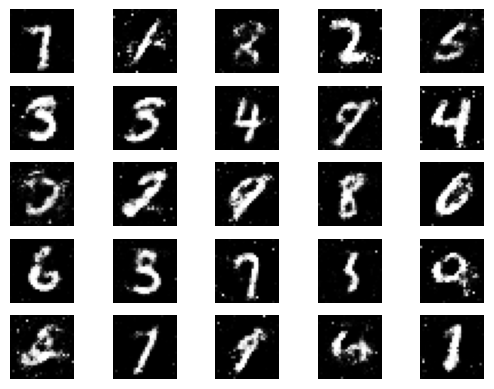

2/2 [==============================] - 0s 15ms/step
Epoch 8300, Discriminator Loss: 0.5755341053009033, Generator Loss: 1.2966669797897339


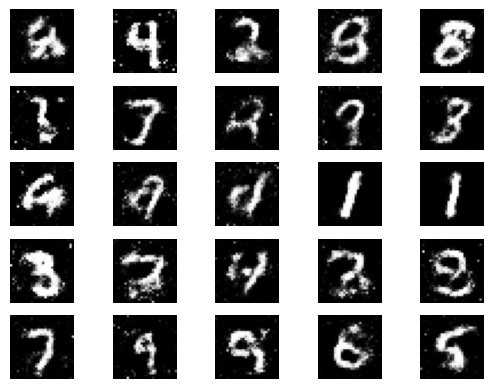

2/2 [==============================] - 0s 0s/step
Epoch 8400, Discriminator Loss: 0.6304029822349548, Generator Loss: 1.1239429712295532


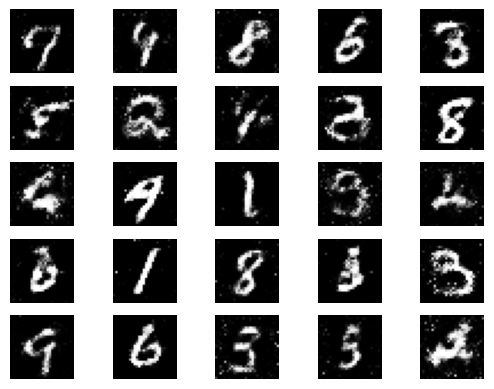

2/2 [==============================] - 0s 14ms/step
Epoch 8500, Discriminator Loss: 0.637528657913208, Generator Loss: 0.9825510382652283


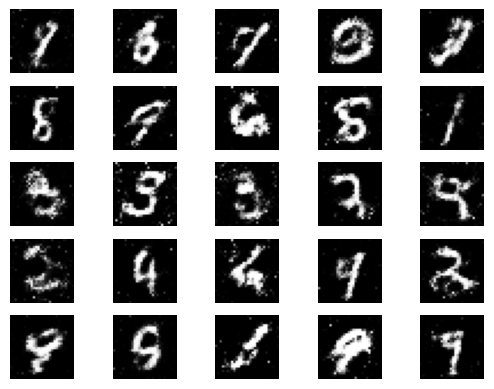

2/2 [==============================] - 0s 0s/step
Epoch 8600, Discriminator Loss: 0.6028534770011902, Generator Loss: 0.8874051570892334


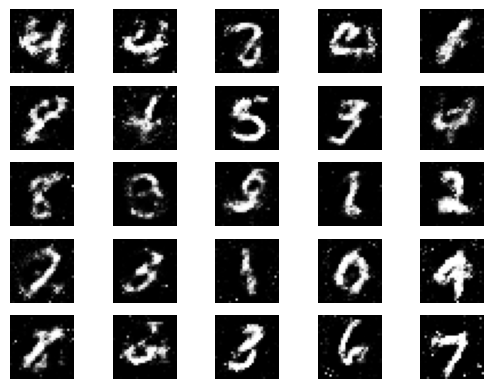

2/2 [==============================] - 0s 16ms/step
Epoch 8700, Discriminator Loss: 0.624002993106842, Generator Loss: 1.0079267024993896


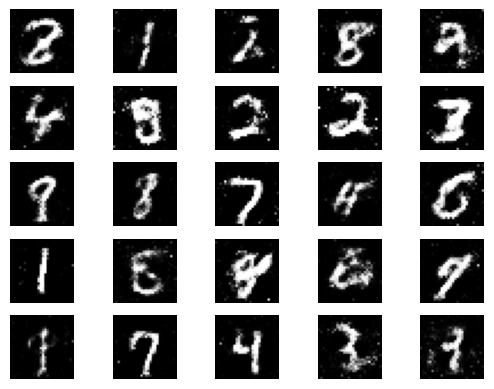

2/2 [==============================] - 0s 16ms/step
Epoch 8800, Discriminator Loss: 0.5757259130477905, Generator Loss: 1.0135209560394287


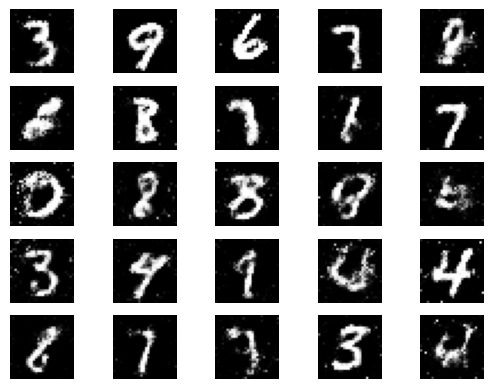

2/2 [==============================] - 0s 16ms/step
Epoch 8900, Discriminator Loss: 0.6196625232696533, Generator Loss: 1.0194981098175049


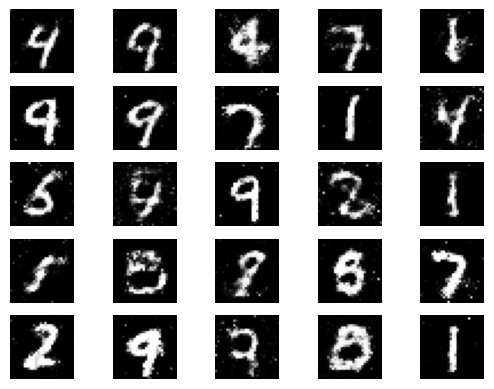

2/2 [==============================] - 0s 16ms/step
Epoch 9000, Discriminator Loss: 0.6474301218986511, Generator Loss: 1.1799397468566895


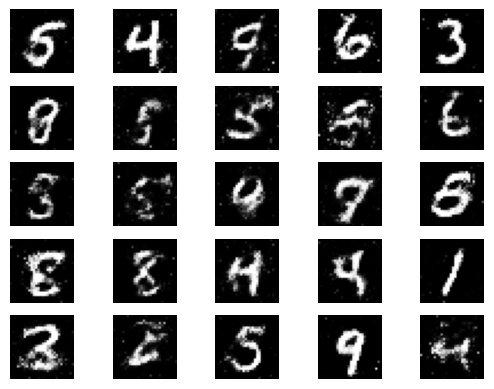

2/2 [==============================] - 0s 0s/step
Epoch 9100, Discriminator Loss: 0.6367815136909485, Generator Loss: 0.9972026348114014


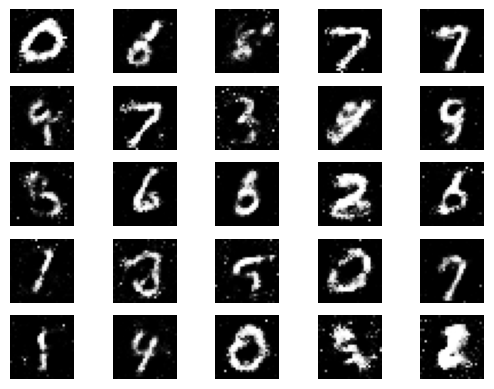

2/2 [==============================] - 0s 16ms/step
Epoch 9200, Discriminator Loss: 0.6011914610862732, Generator Loss: 1.1514935493469238


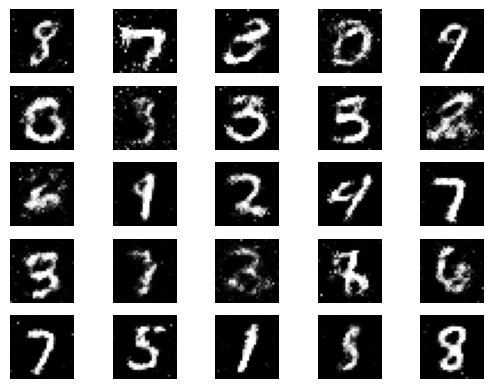

2/2 [==============================] - 0s 0s/step
Epoch 9300, Discriminator Loss: 0.7013671398162842, Generator Loss: 0.9049999713897705


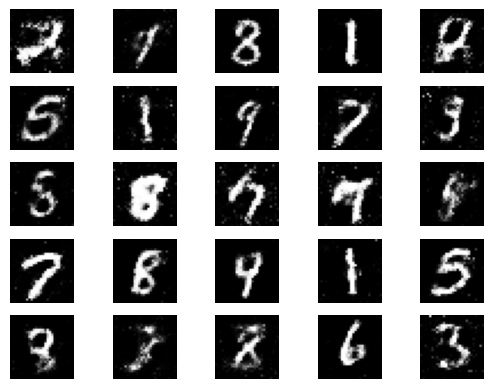

2/2 [==============================] - 0s 0s/step
Epoch 9400, Discriminator Loss: 0.5652331113815308, Generator Loss: 1.0964851379394531


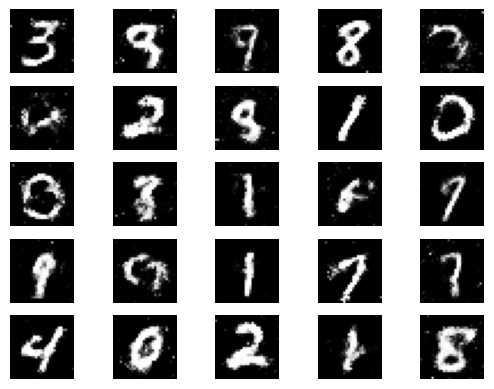

2/2 [==============================] - 0s 16ms/step
Epoch 9500, Discriminator Loss: 0.5826743245124817, Generator Loss: 1.0849266052246094


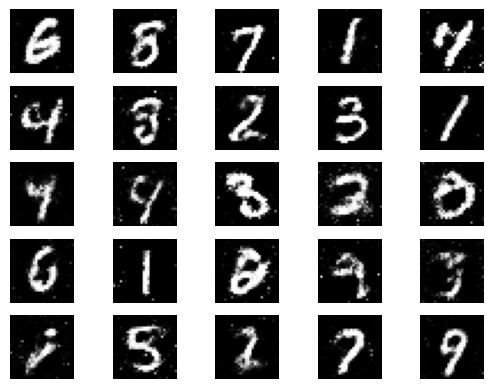

2/2 [==============================] - 0s 0s/step
Epoch 9600, Discriminator Loss: 0.6408389210700989, Generator Loss: 1.1541175842285156


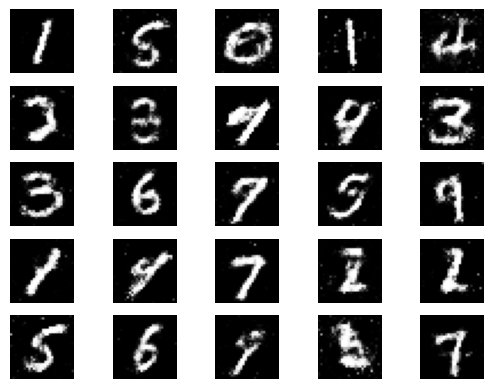

2/2 [==============================] - 0s 0s/step
Epoch 9700, Discriminator Loss: 0.6001135110855103, Generator Loss: 1.0658941268920898


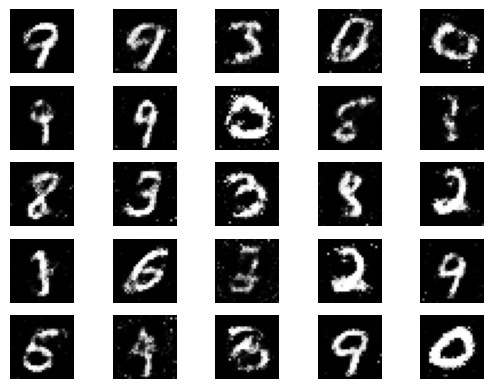

2/2 [==============================] - 0s 16ms/step
Epoch 9800, Discriminator Loss: 0.5273316502571106, Generator Loss: 1.4692630767822266


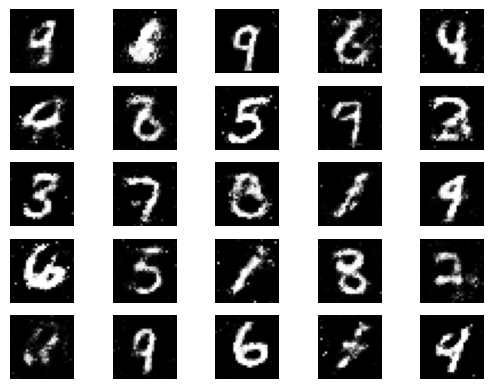

2/2 [==============================] - 0s 0s/step
Epoch 9900, Discriminator Loss: 0.6161046028137207, Generator Loss: 1.0022073984146118


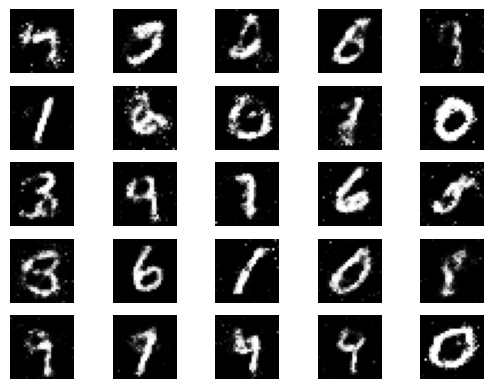

2/2 [==============================] - 0s 16ms/step


In [11]:
epochs = 10000
batch_size = 64

for epoch in range(epochs):
    noise = np.random.normal(0, 1, size=[batch_size, 100])
    generated_images = generator.predict(noise)

    batch_start = np.random.randint(0, train_images.shape[0] - batch_size)
    real_images = train_images[batch_start: batch_start + batch_size]
    real_images = np.expand_dims(real_images, axis=-1)

    X = np.concatenate([real_images, generated_images])

    y_dis = np.zeros(2 * batch_size)
    y_dis[:batch_size] = 0.9

    d_loss = discriminator.train_on_batch(X, y_dis)

    noise = np.random.normal(0, 1, size=[batch_size, 100])
    y_gen = np.ones(batch_size)

    g_loss = gan.train_on_batch(noise, y_gen)

    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Discriminator Loss: {d_loss[0]}, Generator Loss: {g_loss}")

        generated_images = generated_images * 0.5 + 0.5
        fig, axs = plt.subplots(5, 5)
        count = 0
        for i in range(5):
            for j in range(5):
                axs[i, j].imshow(generated_images[count, :, :, 0], cmap='gray')
                axs[i, j].axis('off')
                count += 1
        plt.show()